# Worksheet 3 - Filtering in the spatial domain (TPI.2)

#### **Autores**
- Ivo Filipe Carvalho de Sá, a22604
- Diogo Sousa Gomes, a22588

#### Notes:
- The purpose of this worksheet is to implement the concepts learned in the Biomedical Image Processing - Filtering in the spatial domain 
- The resolution of the exercises of this practical work must be sent by email with the name "PIB_GroupNumber_TPI.2"
- The images to be used are available in the curricular unit's moodle - "Worksheet images"

In [3]:

# ==========================================================
# BIBLIOTECAS UTILIZADAS
# ==========================================================

# NumPy
# Biblioteca base para computação numérica.
# Permite manipulação eficiente de arrays multidimensionais,
# fundamentais no processamento digital de imagem.
import numpy as np


# Matplotlib
# Utilizado para leitura e visualização de imagens.

# Módulo image: leitura de ficheiros de imagem para arrays NumPy
import matplotlib.image as mpimg

# Módulo pyplot: criação de gráficos, figuras e visualizações
import matplotlib.pyplot as plt


# ipywidgets
# Permite criar componentes interativos no Jupyter Notebook,
# como botões de upload e outros elementos gráficos.
import ipywidgets as widgets


# IPython.display
# Função display() utilizada para renderizar widgets
# e outputs visuais nas células do Notebook.
from IPython.display import display


# io
# Biblioteca standard para manipulação de fluxos binários.
# Utilizada para converter bytes em objetos do tipo ficheiro
# (ex: BytesIO), compatíveis com funções de leitura de imagem.
import io

## Funções genéricas utilizadas
    -> Função auxiliar para visualização de imagens.
    -> apresenta até 4 imagens lado a lado;
    -> permite adicionar títulos;
    -> aplica automaticamente colormap para imagens grayscale;
    -> reduz repetição de código no notebook.

### I. Função de apresentação 


#### 1. Função `mostrar_imagens()`

Função auxiliar para visualização de imagens.

- apresenta até 4 imagens lado a lado;
- permite adicionar títulos;
- aplica automaticamente colormap para imagens grayscale;
- reduz repetição de código no notebook.

In [4]:
# ==========================================================
# 1. APRESENTAÇÃO DE IMAGENS (MODULAR)
# ==========================================================

def mostrar_imagens(imagens, titulos=None, mostrar_eixos=False, cmap="gray"):
    """
    Visualiza até 4 imagens alinhadas horizontalmente utilizando Matplotlib.

    Parâmetros:
        imagens (list): Lista contendo entre 1 e 4 arrays NumPy.
        titulos (list, opcional): Lista de títulos para cada imagem.
        mostrar_eixos (bool): Se True, apresenta os eixos; se False, oculta-os.
        cmap (str): Colormap a aplicar em imagens grayscale.
    """

    # Verifica se 'imagens' é uma lista
    if not isinstance(imagens, list):
        raise ValueError("O parâmetro 'imagens' deve ser uma lista.")

    # Permitir entre 1 e 4 imagens
    if len(imagens) < 1 or len(imagens) > 4:
        raise ValueError("A função aceita entre 1 e 4 imagens.")

    # Guarda o número de imagens a apresentar
    n = len(imagens)

    # Cria a figura com largura proporcional ao número de imagens
    # (5 unidades por imagem, altura fixa 5)
    plt.figure(figsize=(5 * n, 5))

    # Percorre cada imagem da lista
    for i in range(n):

        # Cria um subplot numa grelha de 1 linha e n colunas
        # i+1 indica a posição atual (index começa em 1 no subplot)
        plt.subplot(1, n, i + 1)

        img = imagens[i]

        # Se for imagem grayscale (2D), aplica cmap
        if img.ndim == 2:
            plt.imshow(img, cmap=cmap)
        else:
            # Se for RGB ou RGBA, não aplica cmap
            plt.imshow(img)

        # Se existirem títulos e houver título correspondente ao índice atual
        if titulos is not None and i < len(titulos):
            plt.title(titulos[i])

        # Se não for para mostrar eixos, remove-os
        if not mostrar_eixos:
            plt.axis("off")

    # Ajusta automaticamente espaçamentos internos da figura
    plt.tight_layout()

    # Renderiza a figura no output
    plt.show()

#### 2. Função `mostrar_tabela()`
Funçao auxiliar para apresentação de tabelas

- apresenta dados estruturados em formato tabular;
- permite definir nomes das colunas;
- permite adicionar um título à tabela;
- ajusta automaticamente o tamanho da figura;
- reduz repetição de código na criação de tabelas com Matplotlib.


In [5]:
# ==========================================================
# 2. APRESENTAÇÃO DE TABELAS (MODULAR)
# ==========================================================

def mostrar_tabela(dados, colunas=None, titulo=None, tamanho=(8, 3), mostrar=True):
    """
    Cria e apresenta uma tabela utilizando Matplotlib.

    Parâmetros:
        dados (list): Lista de listas contendo os dados organizados por linhas.
        colunas (list, opcional): Lista com os nomes das colunas.
        titulo (str, opcional): Título apresentado acima da tabela.
        tamanho (tuple): Dimensão da figura no formato (largura, altura).
        mostrar (bool): Se True, renderiza a tabela no output.
    """

    # Import interno (garante que a função funciona mesmo fora do contexto global)
    import matplotlib.pyplot as plt

    # Cria figura e eixo com o tamanho especificado (largura, altura)
    fig, ax = plt.subplots(figsize=tamanho)

    # Remove os eixos visuais (escala e grelha),
    # pois apenas queremos mostrar a tabela
    ax.axis("off")

    # Cria objeto tabela associado ao eixo atual
    tabela = ax.table(
        cellText=dados,     # Dados organizados por linhas
        colLabels=colunas,  # Cabeçalhos das colunas (se existirem)
        loc="center"        # Posiciona a tabela no centro da figura
    )

    # Desativa ajuste automático do tamanho da fonte
    tabela.auto_set_font_size(False)

    # Define tamanho fixo da fonte
    tabela.set_fontsize(10)

    # Ajusta escala das células (largura, altura)
    tabela.scale(1, 1.5)

    # Se existir título, adiciona-o à figura
    if titulo:
        plt.title(titulo)

    # Renderiza a figura apenas se o parâmetro 'mostrar' for True
    if mostrar:
        plt.show()

    # Devolve a figura e o objeto tabela
    # (permite personalização adicional fora da função)
    return fig, tabela

# Funcionalidades Adicionais
> Embora esta funcionalidade não constasse nos requisitos iniciais do projeto, foi implementada com o objetivo de desenvolver competências técnicas adicionais
>
> **Nota:** Apesar de adicional, é necessário compilar todas as funções para o correto funcionamento do restante código

## I. Seleção das Imagens

Responsável por permitir ao utilizador carregar imagens médicas para o sistema.

- suporta três imagens do mesmo exame:
  - imagem original;
  - imagem com ruído gaussiano;
  - imagem com ruído salt & pepper;
- organiza os dados para posterior processamento;
- garante consistência na entrada do pipeline.

### 1. Função `criar_uploaders()`

Função responsável pela criação de widgets de upload para três imagens específicas.

- cria três componentes `FileUpload`;
- permite selecionar diferentes versões da mesma imagem;
- apresenta os widgets no notebook;
- devolve os uploaders para acesso posterior.

In [13]:
# ==========================================================
# 1. CRIAR UPLOADERS
# ==========================================================

def criar_uploaders():
    """
    Cria três widgets FileUpload para carregamento de imagens.

    Returns:
        tuple: upload_original, upload_gaussian, upload_salt_pepper
    """

    # Criação do uploader para imagem original
    upload_original = widgets.FileUpload(
        accept='image/*',          # Aceita apenas ficheiros de imagem
        multiple=False,            # Apenas um ficheiro
        description='Original'     # Texto do botão
    )

    # Criação do uploader para imagem com ruído gaussiano
    upload_gaussian = widgets.FileUpload(
        accept='image/*',
        multiple=False,
        description='Gaussian Noise'
    )

    # Criação do uploader para imagem com ruído salt & pepper
    upload_salt_pepper = widgets.FileUpload(
        accept='image/*',
        multiple=False,
        description='Salt & Pepper'
    )

    # Apresentação dos widgets no notebook
    display(upload_original)
    display(upload_gaussian)
    display(upload_salt_pepper)

    # Retorno dos widgets para uso posterior
    return upload_original, upload_gaussian, upload_salt_pepper

### 2. Inicialização dos Uploaders

Bloco responsável por instanciar os widgets de upload.

- executa a função de criação de uploaders;
- apresenta os componentes no notebook;
- prepara o sistema para receção das imagens.

In [14]:
# ==========================================================
# 2. INICIALIZAÇÃO
# ==========================================================

# Mensagem informativa para o utilizador
print("=== Upload das Imagens ===")

# Criação dos uploaders
upload_original, upload_gaussian, upload_salt_pepper = criar_uploaders()

=== Upload das Imagens ===


FileUpload(value=(), accept='image/*', description='Original')

FileUpload(value=(), accept='image/*', description='Gaussian Noise')

FileUpload(value=(), accept='image/*', description='Salt & Pepper')

### 3. Carregamento das Imagens

Bloco responsável pela leitura das imagens carregadas.

- define função para conversão de ficheiros em arrays NumPy;
- extrai nome e conteúdo das imagens;
- garante formato correto dos dados;
- prepara imagens para processamento.

In [16]:
# ==========================================================
# 3. CARREGAR IMAGENS
# ==========================================================

def carregar_imagem(upload_widget):
    """
    Converte um ficheiro carregado via FileUpload num array NumPy.

    Args:
        upload_widget (FileUpload): widget contendo o ficheiro carregado

    Returns:
        tuple:
            imagem (ndarray): imagem convertida em array NumPy
            nome (str): nome do ficheiro original
    """

    # Verifica se existe ficheiro carregado
    if not upload_widget.value:
        return None, None

    # Obtém o valor interno do widget
    valor = upload_widget.value

    # Caso o valor seja um dicionário
    if isinstance(valor, dict):
        ficheiro = list(valor.values())[0]

    # Caso o valor seja uma tupla
    elif isinstance(valor, tuple):
        ficheiro = valor[0]

    # Caso inesperado
    else:
        return None, None

    # Extrai nome do ficheiro
    nome = ficheiro['name']

    # Extrai conteúdo em bytes
    conteudo = ficheiro['content']

    # Converte bytes para imagem
    imagem = mpimg.imread(io.BytesIO(conteudo))

    # Normaliza para uint8 se necessário
    if imagem.dtype != np.uint8:
        imagem = (imagem * 255).astype(np.uint8)

    return imagem, nome


# ---------------------------------------------------------
# EXECUÇÃO DO CARREGAMENTO
# ---------------------------------------------------------

# Carregar cada imagem
img_original, nome_original = carregar_imagem(upload_original)
img_gaussian, nome_gaussian = carregar_imagem(upload_gaussian)
img_salt_pepper, nome_salt_pepper = carregar_imagem(upload_salt_pepper)

### 4. Validação e Visualização

Bloco responsável pela verificação e apresentação das imagens.

- valida se todas as imagens foram carregadas;
- impede execução em caso de erro;
- apresenta imagens lado a lado;
- utiliza nomes reais como títulos.

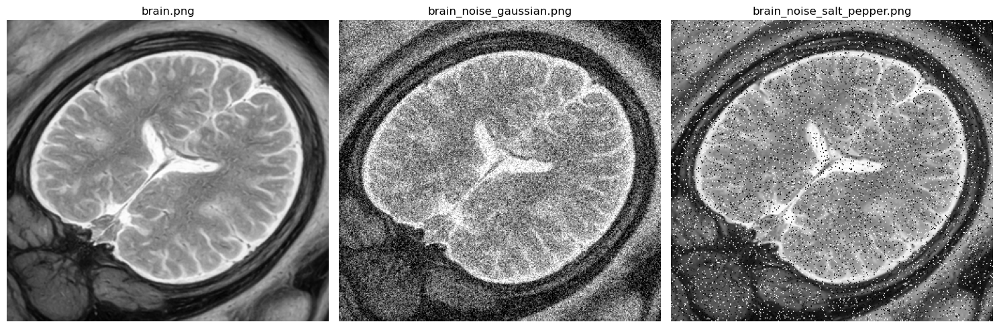

In [17]:
# ==========================================================
# 4. VALIDAÇÃO E VISUALIZAÇÃO
# ==========================================================

# Verificar se alguma imagem não foi carregada
if img_original is None or img_gaussian is None or img_salt_pepper is None:

    print("Erro: faltam imagens. Verifique os uploads.")

else:

    # Apresentação das imagens
    mostrar_imagens(
        imagens=[img_original, img_gaussian, img_salt_pepper],
        titulos=[nome_original, nome_gaussian, nome_salt_pepper],
        mostrar_eixos=False,
        cmap="gray"
    )

## II. Analisar e Converter Metadados

Esta secção assegura a normalização e padronização estrutural das imagens carregadas, garantindo que se encontram num formato consistente e adequado para processamento posterior.

O objetivo principal é eliminar variações estruturais (formato de cor e tipo de dados) que possam comprometer etapas seguintes da análise.

- analisa propriedades fundamentais das imagens;
- converte imagens para grayscale;
- normaliza o tipo de dados para uint8;
- garante consistência no pipeline de processamento.

### 1. Função `analisar_metadados()`

Função responsável pela análise estrutural das imagens.

- identifica dimensão (`shape`);
- identifica tipo de dados (`dtype`);
- determina o número de canais;
- permite verificar o estado das imagens antes do processamento.

In [19]:
# ==========================================================
# 1. ANALISAR METADADOS
# ==========================================================

def analisar_metadados(img_original, img_gaussian, img_salt_pepper):
    """
    Analisa propriedades estruturais das imagens.

    Args:
        img_original (ndarray): imagem original
        img_gaussian (ndarray): imagem com ruído gaussiano
        img_salt_pepper (ndarray): imagem com ruído salt & pepper

    Returns:
        dict: dicionário com shape, dtype e número de canais
    """

    # Determinar número de canais (1 = grayscale, 3 = RGB)
    canais1 = 1 if img_original.ndim == 2 else img_original.shape[2]
    canais2 = 1 if img_gaussian.ndim == 2 else img_gaussian.shape[2]
    canais3 = 1 if img_salt_pepper.ndim == 2 else img_salt_pepper.shape[2]

    # Construção do dicionário de metadados
    return {
        "Shape": [img_original.shape, img_gaussian.shape, img_salt_pepper.shape],
        "Dtype": [img_original.dtype, img_gaussian.dtype, img_salt_pepper.dtype],
        "Canais": [canais1, canais2, canais3]
    }


# ---------------------------------------------------------
# EXECUÇÃO
# ---------------------------------------------------------

metadados = analisar_metadados(img_original, img_gaussian, img_salt_pepper)

print("=== Metadados Iniciais ===")

for i, nome in enumerate(["Original", "Gaussian", "Salt & Pepper"]):
    print(f"{nome} → Shape: {metadados['Shape'][i]}, "
          f"Dtype: {metadados['Dtype'][i]}, "
          f"Canais: {metadados['Canais'][i]}")

=== Metadados Iniciais ===
Original → Shape: (321, 343), Dtype: uint8, Canais: 1
Gaussian → Shape: (321, 343), Dtype: uint8, Canais: 1
Salt & Pepper → Shape: (321, 343), Dtype: uint8, Canais: 1


### 2. Função `converter_para_grayscale()`

Função responsável pela conversão das imagens para escala de cinzentos.

- verifica se a imagem já se encontra em grayscale;
- converte imagens RGB utilizando ponderação de luminância;
- preserva dimensões espaciais;
- prepara imagens para processamento de intensidades.

In [20]:
# ==========================================================
# 2. CONVERTER PARA GRAYSCALE
# ==========================================================

def converter_para_grayscale(img_original, img_gaussian, img_salt_pepper):
    """
    Converte imagens RGB para grayscale.

    Args:
        img_original, img_gaussian, img_salt_pepper (ndarray)

    Returns:
        tuple: imagens convertidas para grayscale
    """

    # Função interna para converter uma única imagem
    def to_gray(img):
        # Se já for grayscale, retorna diretamente
        if img.ndim == 2:
            return img
        
        # Extrair canais RGB
        r = img[:, :, 0]
        g = img[:, :, 1]
        b = img[:, :, 2]

        # Aplicar fórmula de luminância
        return 0.299*r + 0.587*g + 0.114*b

    return (
        to_gray(img_original),
        to_gray(img_gaussian),
        to_gray(img_salt_pepper)
    )


# ---------------------------------------------------------
# EXECUÇÃO
# ---------------------------------------------------------

img_original, img_gaussian, img_salt_pepper = converter_para_grayscale(
    img_original, img_gaussian, img_salt_pepper
)

print("Conversão para grayscale concluída.")

Conversão para grayscale concluída.


### 3. Função `garantir_uint8()`

Função responsável pela normalização do tipo de dados das imagens.

- verifica se já estão em `uint8`;
- converte imagens normalizadas (0–1) para intervalo 0–255;
- limita valores ao intervalo válido;
- garante compatibilidade com operações de processamento.

In [21]:
# ==========================================================
# 3. GARANTIR UINT8
# ==========================================================

def garantir_uint8(img_original, img_gaussian, img_salt_pepper):
    """
    Converte imagens para formato uint8 (0–255).

    Args:
        imagens (ndarray)

    Returns:
        tuple: imagens convertidas para uint8
    """

    def to_uint8(img):
        # Se já for uint8, devolver diretamente
        if img.dtype == np.uint8:
            return img
        
        # Escalar intensidades
        img = img * 255
        
        # Arredondar valores
        img = np.round(img)
        
        # Limitar intervalo
        img = np.clip(img, 0, 255)
        
        # Converter tipo
        return img.astype(np.uint8)

    return (
        to_uint8(img_original),
        to_uint8(img_gaussian),
        to_uint8(img_salt_pepper)
    )


# ---------------------------------------------------------
# EXECUÇÃO
# ---------------------------------------------------------

img_original, img_gaussian, img_salt_pepper = garantir_uint8(
    img_original, img_gaussian, img_salt_pepper
)

print("Conversão para uint8 concluída.")

Conversão para uint8 concluída.


# Questões propostas


### **Question 1**
> Read and visualize the "brain.png" image and its noisy versions "brain_noise_gaussian.png" and "brain_noise_salt_pepper". You must view the images side by side (horizontally)

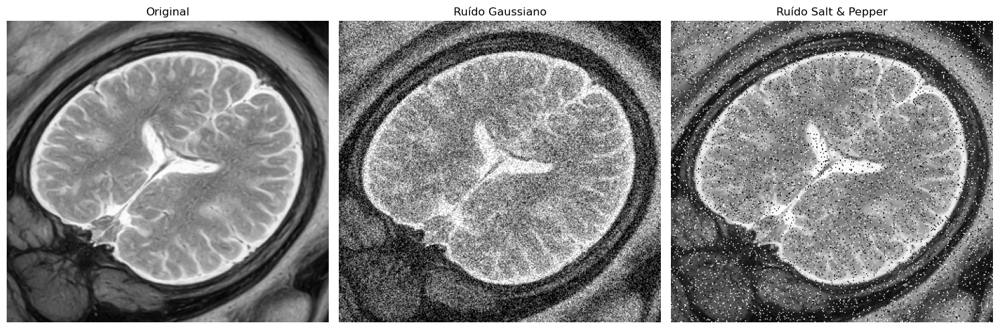

In [22]:
# ==========================================================
# 1. VISUALIZAÇÃO DAS IMAGENS
# ==========================================================

# Apresentação das imagens lado a lado
mostrar_imagens(
    imagens=[img_original, img_gaussian, img_salt_pepper],
    titulos=[
        "Original",
        "Ruído Gaussiano",
        "Ruído Salt & Pepper"
    ],
    mostrar_eixos=False,
    cmap="gray"
)

#### Observações

- A imagem original apresenta uma distribuição de intensidades homogénea, sem perturbações visuais.
- A imagem com ruído gaussiano apresenta variações suaves de intensidade distribuídas por toda a imagem, resultando numa aparência granulada.
- A imagem com ruído salt & pepper apresenta pontos brancos e pretos dispersos, caracterizando ruído impulsivo.

> Esta comparação evidencia diferenças estruturais entre os tipos de ruído, sendo relevante para a seleção de técnicas de filtragem adequadas em etapas posteriores.

### **Question 2**
> Build a function to filter an image using a median filter.

In [24]:
# ==========================================================
# FILTRO MEDIANA (VERSÃO CORRIGIDA E ACADÉMICA)
# ==========================================================

def median(img_brain, s):
    """
    Aplica filtro de mediana a uma imagem.

    Args:
        img_brain (ndarray): imagem em grayscale
        s (int): tamanho da vizinhança (ímpar)

    Returns:
        ndarray: imagem filtrada
    """

    # ---------------------------------------------------------
    # VALIDAR KERNEL
    # ---------------------------------------------------------

    if s % 2 == 0:
        raise ValueError("O tamanho da vizinhança deve ser ímpar.")

    # ---------------------------------------------------------
    # CALCULAR PADDING
    # ---------------------------------------------------------

    p = int(s / 2)

    # Aplicar padding (modo edge para evitar zeros artificiais)
    img_p = np.pad(img_brain, p, mode='edge')

    # ---------------------------------------------------------
    # DIMENSÕES DA IMAGEM ORIGINAL
    # ---------------------------------------------------------

    (w, h) = img_brain.shape

    # Criar imagem de saída (mesmo tamanho da original)
    img_Transf = np.zeros((w, h), dtype=np.uint8)

    # ---------------------------------------------------------
    # PERCORRER IMAGEM
    # ---------------------------------------------------------

    for i in range(p, p + w):
        for j in range(p, p + h):

            # Extrair vizinhança
            viz = img_p[i-p:i+p+1, j-p:j+p+1]

            # Converter vizinhança para lista
            lista = viz.flatten().tolist()

            # Ordenar lista
            lista.sort()

            # Calcular mediana manualmente
            n = len(lista)

            if n % 2 == 1:
                mediana = lista[n // 2]
            else:
                mediana = (lista[n // 2 - 1] + lista[n // 2]) / 2

            # Atribuir valor (ajustando índice para imagem original)
            img_Transf[i-p, j-p] = mediana

    return img_Transf

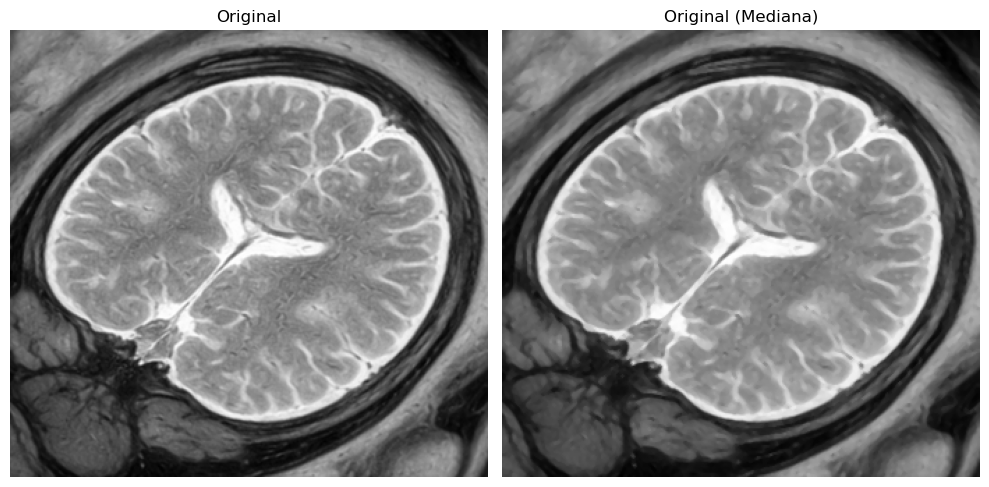

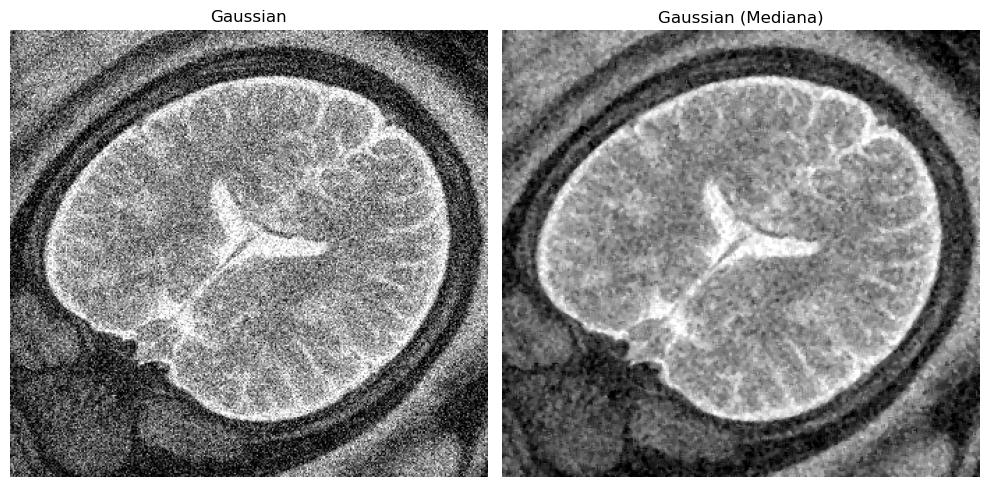

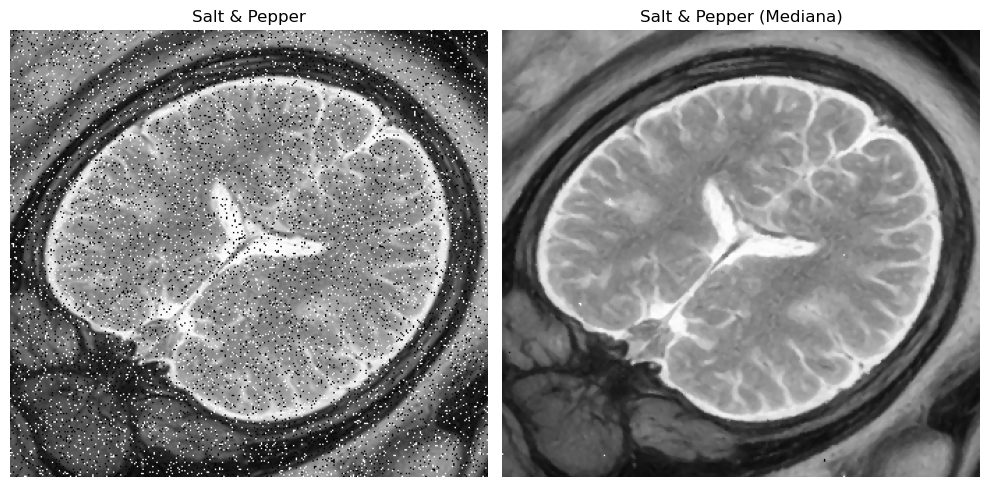

In [25]:
# ==========================================================
# APLICAR FILTRO MEDIANA
# ==========================================================

# Aplicar filtro de mediana às três imagens
img_original_med = median(img_original, 3)
img_gaussian_med = median(img_gaussian, 3)
img_salt_pepper_med = median(img_salt_pepper, 3)


# Comparação imagem a imagem

mostrar_imagens(
    imagens=[img_original, img_original_med],
    titulos=["Original", "Original (Mediana)"]
)

mostrar_imagens(
    imagens=[img_gaussian, img_gaussian_med],
    titulos=["Gaussian", "Gaussian (Mediana)"]
)

mostrar_imagens(
    imagens=[img_salt_pepper, img_salt_pepper_med],
    titulos=["Salt & Pepper", "Salt & Pepper (Mediana)"]
)



#### Observações

- Na imagem original, o filtro de mediana introduz uma ligeira suavização, sem alterações significativas.
- Na imagem com ruído gaussiano, a redução de ruído é limitada, mantendo-se alguma granulação.
- Na imagem com ruído salt & pepper, o filtro elimina eficazmente os pontos extremos, melhorando significativamente a qualidade visual.

> O filtro de mediana demonstra maior eficácia na remoção de ruído impulsivo (salt & pepper), sendo menos eficiente em ruído gaussiano.

### **Question 3**
> Build a function to filter an image using the principle of convolution with kernels.

In [26]:
# ==========================================================
# 3. FILTRO POR CONVOLUÇÃO
# ==========================================================

def filtro_convolucao(img_brain, kernel):
    """
    Aplica um filtro de convolução a uma imagem.

    Args:
        img_brain (ndarray): imagem em grayscale
        kernel (ndarray): matriz do kernel

    Returns:
        ndarray: imagem filtrada
    """

    # ---------------------------------------------------------
    # DIMENSÃO DO KERNEL
    # ---------------------------------------------------------

    s = kernel.shape[0]

    # validar kernel quadrado
    if kernel.shape[0] != kernel.shape[1]:
        raise ValueError("O kernel deve ser quadrado.")

    # calcular padding
    p = int(s / 2)

    # ---------------------------------------------------------
    # PADDING DA IMAGEM
    # ---------------------------------------------------------

    img_p = np.pad(img_brain, p, mode='edge')

    # ---------------------------------------------------------
    # DIMENSÕES
    # ---------------------------------------------------------

    (w, h) = img_brain.shape

    # imagem de saída
    img_Transf = np.zeros((w, h))

    # ---------------------------------------------------------
    # CONVOLUÇÃO
    # ---------------------------------------------------------

    for i in range(p, p + w):
        for j in range(p, p + h):

            # extrair vizinhança
            viz = img_p[i-p:i+p+1, j-p:j+p+1]

            # multiplicação elemento a elemento
            mult = viz * kernel

            # soma dos valores
            valor = np.sum(mult)

            # atribuir ao pixel (corrigindo índice)
            img_Transf[i-p, j-p] = valor

    # garantir intervalo válido
    img_Transf = np.clip(img_Transf, 0, 255)

    return img_Transf.astype(np.uint8)

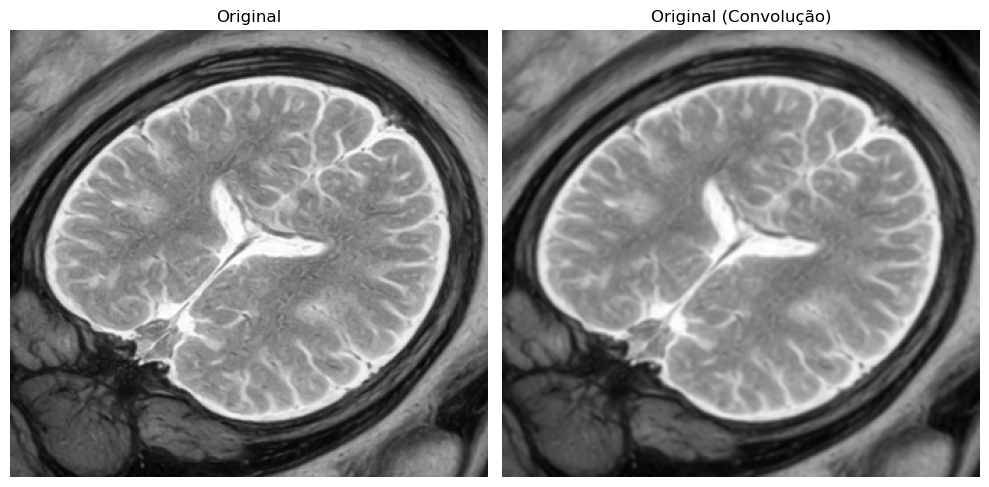

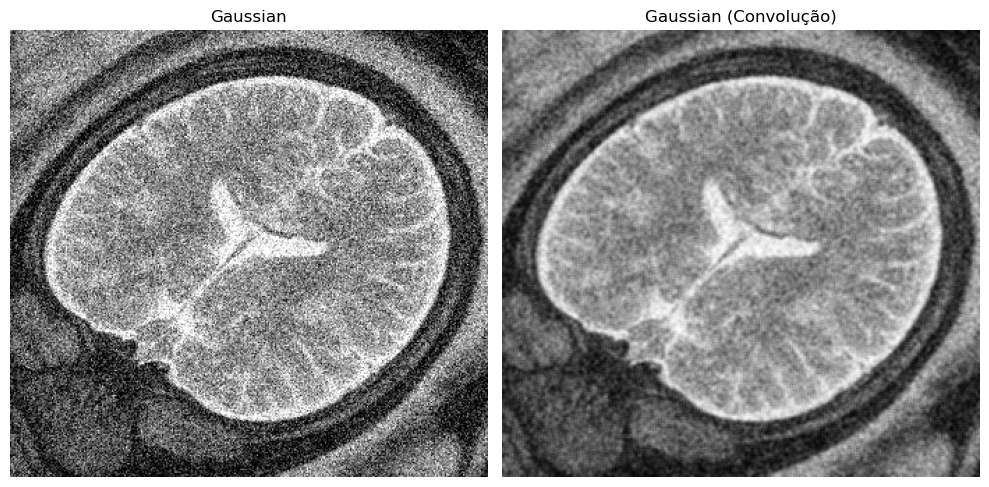

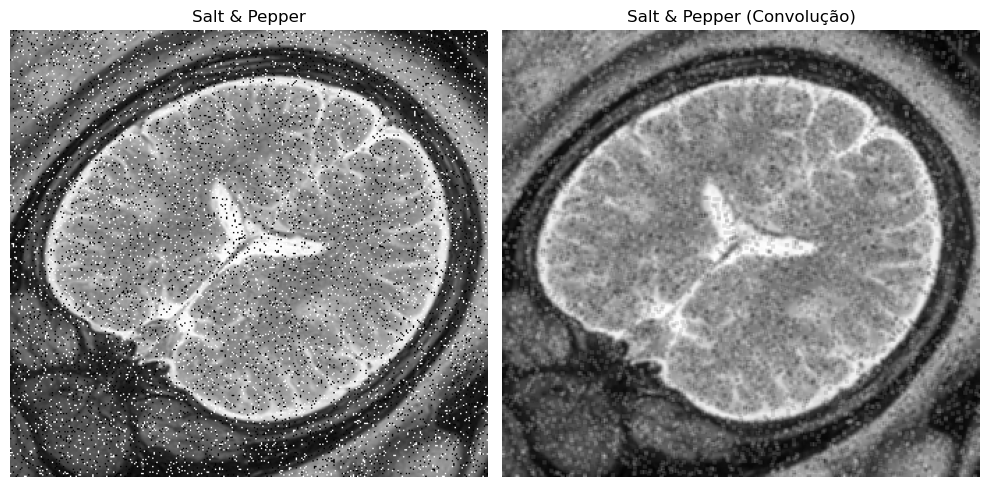

In [29]:
# ==========================================================
# APLICAR FILTRO DE CONVOLUÇÃO
# ==========================================================

# Definição do kernel média (3x3)
kernel_media = np.array([
    [1/9, 1/9, 1/9],
    [1/9, 1/9, 1/9],
    [1/9, 1/9, 1/9]
])

# Aplicação do filtro
img_original_conv = filtro_convolucao(img_original, kernel_media)
img_gaussian_conv = filtro_convolucao(img_gaussian, kernel_media)
img_salt_pepper_conv = filtro_convolucao(img_salt_pepper, kernel_media)


# ==========================================================
# VISUALIZAÇÃO COMPARATIVA
# ==========================================================

# ORIGINAL
mostrar_imagens(
    imagens=[img_original, img_original_conv],
    titulos=["Original", "Original (Convolução)"]
)

# GAUSSIAN
mostrar_imagens(
    imagens=[img_gaussian, img_gaussian_conv],
    titulos=["Gaussian", "Gaussian (Convolução)"]
)

# SALT & PEPPER
mostrar_imagens(
    imagens=[img_salt_pepper, img_salt_pepper_conv],
    titulos=["Salt & Pepper", "Salt & Pepper (Convolução)"]
)

#### Observações

- O filtro por convolução suaviza a imagem, reduzindo variações de intensidade.
- No caso do ruído gaussiano, observa-se uma melhoria significativa.
- No ruído salt & pepper, o filtro é menos eficaz, mantendo alguns artefactos.
- O filtro tende a suavizar também os contornos, ao contrário do filtro de mediana.

> A convolução é adequada para ruído gaussiano, mas menos eficiente para ruído impulsivo(salt & pepper).

### **Question 4**
> Build a function to generate a kernel of a gaussian filter.

In [30]:
# ==========================================================
# 4. KERNEL GAUSSIANO (SEM math.pi)
# ==========================================================

def Gaussian_kernel(k, sigma):
    """
    Gera um kernel Gaussiano 2D.

    Args:
        k (int): tamanho do kernel (ímpar)
        sigma (float): desvio padrão

    Returns:
        ndarray: kernel normalizado
    """

    # Constante PI definida manualmente
    PI = 3.141592653589793

    # Validação
    if k % 2 == 0:
        raise ValueError("O tamanho do kernel deve ser ímpar.")

    if sigma <= 0:
        raise ValueError("Sigma deve ser positivo.")

    # Inicialização
    w = int(k / 2)
    Gauss = np.zeros((k, k))

    # Cálculo do kernel
    for i in range(-w, w + 1):
        for j in range(-w, w + 1):

            Gauss[i + w, j + w] = (
                1 / (2 * PI * (sigma ** 2))
            ) * np.exp(
                -((i**2 + j**2) / (2 * (sigma ** 2)))
            )

    # Normalização
    Gauss = Gauss / Gauss.sum()

    return Gauss

In [31]:
kernel_gauss = Gaussian_kernel(3, 1)

print("Kernel Gaussiano:")
print(kernel_gauss)
print("Soma:", kernel_gauss.sum())

Kernel Gaussiano:
[[0.07511361 0.1238414  0.07511361]
 [0.1238414  0.20417996 0.1238414 ]
 [0.07511361 0.1238414  0.07511361]]
Soma: 1.0


#### Observações

- O kernel apresenta valores mais elevados no centro e decrescentes nas extremidades.
- O parâmetro sigma controla a dispersão da distribuição.
- A normalização garante que a soma dos valores é igual a 1.
- O kernel é adequado para suavização e redução de ruído gaussiano.

> O filtro Gaussiano é amplamente utilizado em processamento de imagem devido à sua capacidade de suavização sem introduzir descontinuidades abruptas.

### **Question 5**
> Build a function to generate a kernel of a mean filter.

In [32]:
# ==========================================================
# 5. KERNEL DO FILTRO DA MÉDIA
# ==========================================================

def kernel_mean(k):
    """
    Gera um kernel de média (mean filter).

    Args:
        k (int): tamanho do kernel (deve ser ímpar)

    Returns:
        ndarray: kernel normalizado
    """

    # ---------------------------------------------------------
    # VALIDAÇÃO DO PARÂMETRO
    # ---------------------------------------------------------

    if k % 2 == 0:
        raise ValueError("O tamanho do kernel deve ser ímpar.")

    # ---------------------------------------------------------
    # CRIAÇÃO DO KERNEL
    # ---------------------------------------------------------

    # Criar matriz k x k preenchida com 1
    kernel = np.ones((k, k))

    # ---------------------------------------------------------
    # NORMALIZAÇÃO
    # ---------------------------------------------------------

    # Dividir todos os elementos por k²
    # Isto garante que a soma total do kernel é 1
    kernel = kernel / (k * k)

    return kernel

In [36]:
# Criar kernel 3x3
kernel_media = kernel_mean(3)

print("Kernel da Média:")
print(kernel_media)
print("Soma:", kernel_media.sum())

Kernel da Média:
[[0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]]
Soma: 1.0


#### Observações

- O kernel apresenta valores uniformes em toda a matriz.
- A normalização garante que a soma dos elementos é igual a 1.
- O filtro da média realiza uma suavização global da imagem.
- Este tipo de filtro reduz ruído, mas também provoca perda de detalhe e suavização dos contornos.

> O filtro da média é adequado para redução de ruído gaussiano, mas menos eficaz na preservação de estruturas importantes da imagem.

### **Question 6**
> Apply a mean, median and gaussian filter (kernels 5x5) to the images "brain_noise_gaussian.png" and "brain_noise_salt_pepper". Comment the results.

In [40]:
# ==========================================================
# KERNELS 5x5
# ==========================================================

# Mean filter
kernel_mean_5 = kernel_mean(5)

# Gaussian filter
kernel_gauss_5 = Gaussian_kernel(5, 1)

# ==========================================================
# APLICAR FILTROS - GAUSSIAN NOISE
# ==========================================================

img_gaussian_mean = filtro_convolucao(img_gaussian, kernel_mean_5)
img_gaussian_gauss = filtro_convolucao(img_gaussian, kernel_gauss_5)
img_gaussian_med = median(img_gaussian, 5)


# ==========================================================
# APLICAR FILTROS - SALT & PEPPER
# ==========================================================

img_salt_mean = filtro_convolucao(img_salt_pepper, kernel_mean_5)
img_salt_gauss = filtro_convolucao(img_salt_pepper, kernel_gauss_5)
img_salt_med = median(img_salt_pepper, 5)


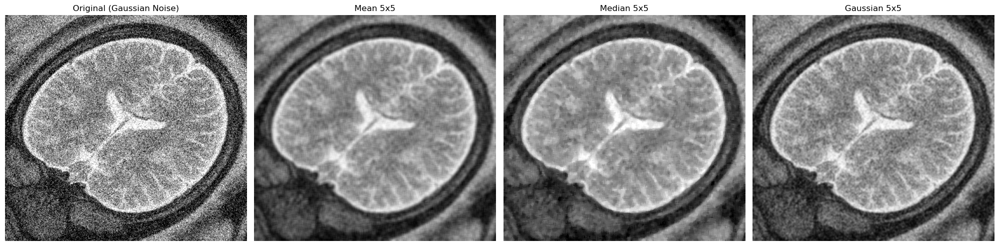

In [43]:
mostrar_imagens(
    imagens=[
        img_gaussian,
        img_gaussian_mean,
        img_gaussian_med,
        img_gaussian_gauss
    ],
    titulos=[
        "Original (Gaussian Noise)",
        "Mean 5x5",
        "Median 5x5",
        "Gaussian 5x5"
    ]
)

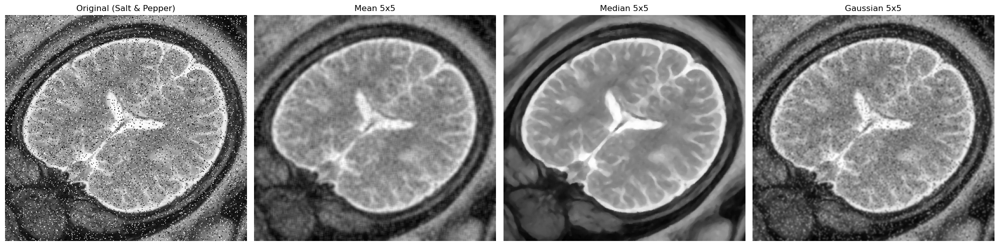

In [44]:
mostrar_imagens(
    imagens=[
        img_salt_pepper,
        img_salt_mean,
        img_salt_med,
        img_salt_gauss
    ],
    titulos=[
        "Original (Salt & Pepper)",
        "Mean 5x5",
        "Median 5x5",
        "Gaussian 5x5"
    ]
)

#### Observações

- No caso do ruído gaussiano, os filtros da média e gaussiano apresentam bons resultados, reduzindo significativamente a granulação da imagem.
- O filtro gaussiano preserva melhor os contornos quando comparado com o filtro da média.
- O filtro de mediana apresenta menor eficácia no ruído gaussiano.

- No caso do ruído salt & pepper, o filtro de mediana apresenta o melhor desempenho, eliminando eficazmente os valores extremos.
- Os filtros da média e gaussiano não conseguem remover completamente o ruído impulsivo, mantendo artefactos na imagem.
- O aumento do kernel (5x5) intensifica o efeito de suavização, mas também provoca perda de detalhe.

> Cada filtro apresenta melhor desempenho consoante o tipo de ruído, sendo essencial selecionar a técnica adequada para cada situação.

### **Question 7**
> Apply the mean filter to the image "brain_noise_gaussian.png" using different kernels, namely 3x3, 7x7, 11x11. Comment the results.

In [45]:
# ==========================================================
# KERNELS DIFERENTES
# ==========================================================

kernel_3 = kernel_mean(3)
kernel_7 = kernel_mean(7)
kernel_11 = kernel_mean(11)

# ==========================================================
# APLICAR FILTROS
# ==========================================================

img_mean_3 = filtro_convolucao(img_gaussian, kernel_3)
img_mean_7 = filtro_convolucao(img_gaussian, kernel_7)
img_mean_11 = filtro_convolucao(img_gaussian, kernel_11)

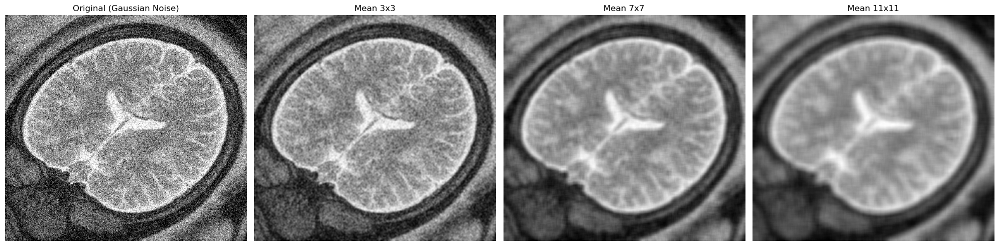

In [46]:
mostrar_imagens(
    imagens=[
        img_gaussian,
        img_mean_3,
        img_mean_7,
        img_mean_11
    ],
    titulos=[
        "Original (Gaussian Noise)",
        "Mean 3x3",
        "Mean 7x7",
        "Mean 11x11"
    ]
)

#### Observações

- O kernel 3x3 apresenta uma ligeira suavização, mantendo a maioria dos detalhes da imagem.
- O kernel 7x7 reduz significativamente o ruído, mas começa a suavizar estruturas importantes.
- O kernel 11x11 produz uma forte suavização, eliminando grande parte do ruído, mas com elevada perda de detalhe.

- À medida que o tamanho do kernel aumenta, a redução de ruído torna-se mais eficaz.
- No entanto, ocorre uma degradação progressiva da nitidez da imagem.

> Existe um compromisso entre redução de ruído e preservação de detalhe, sendo necessário escolher o tamanho do kernel de acordo com o objetivo da análise.

### **Question 8**
> Detect the edges of the image "brain_noise_salt_pepper.png" using the sobel filter. It should present the results for the derivatives for each direction, as well as the final result.

In [47]:
# ==========================================================
# KERNELS SOBEL
# ==========================================================

sobel_x = np.array([
    [-1, 0, 1],
    [-2, 0, 2],
    [-1, 0, 1]
])

sobel_y = np.array([
    [-1, -2, -1],
    [ 0,  0,  0],
    [ 1,  2,  1]
])

# ==========================================================
# APLICAR SOBEL
# ==========================================================

gx = filtro_convolucao(img_salt_pepper, sobel_x)
gy = filtro_convolucao(img_salt_pepper, sobel_y)

# ==========================================================
# MAGNITUDE DO GRADIENTE
# ==========================================================

# Converter para float para evitar overflow
gx = gx.astype(float)
gy = gy.astype(float)

# Calcular magnitude
gradiente = np.sqrt(gx**2 + gy**2)

# Normalizar para 0-255
gradiente = (gradiente / gradiente.max()) * 255
gradiente = gradiente.astype(np.uint8)

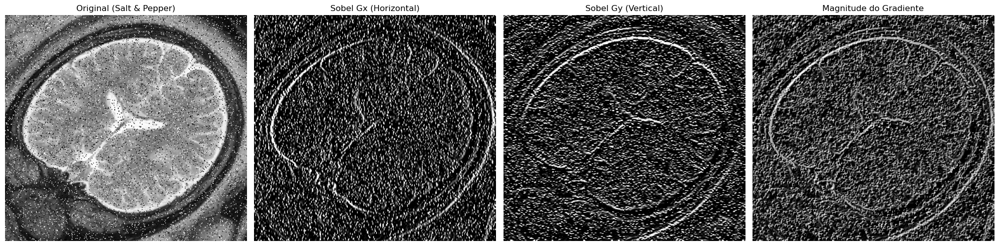

In [48]:
mostrar_imagens(
    imagens=[
        img_salt_pepper,
        gx,
        gy,
        gradiente
    ],
    titulos=[
        "Original (Salt & Pepper)",
        "Sobel Gx (Horizontal)",
        "Sobel Gy (Vertical)",
        "Magnitude do Gradiente"
    ]
)

#### Observações

- A derivada horizontal (Gx) destaca variações de intensidade na direção vertical.
- A derivada vertical (Gy) evidencia variações na direção horizontal.
- A combinação das duas direções permite obter uma representação completa dos contornos.

- A magnitude do gradiente apresenta as bordas mais relevantes da imagem.
- O ruído salt & pepper introduz artefactos que podem ser interpretados como falsas bordas.

> O operador de Sobel é eficaz na deteção de contornos, embora sensível a ruído.

### **Question 9**
> Considering that the objective of contour detection is to obtain the contours of the brain, what could you do to improve the contour map of question 8? Show the result of your solution.

In [51]:
# ==========================================================
# PRÉ-PROCESSAMENTO
# ==========================================================

# Aplicar filtro de mediana (ideal para salt & pepper)
img_salt_filtrada = median(img_salt_pepper, 3)

# ==========================================================
# SOBEL NA IMAGEM FILTRADA
# ==========================================================

gx_f = filtro_convolucao(img_salt_filtrada, sobel_x)
gy_f = filtro_convolucao(img_salt_filtrada, sobel_y)

# Converter para float
gx_f = gx_f.astype(float)
gy_f = gy_f.astype(float)

# Magnitude do gradiente
gradiente_f = np.sqrt(gx_f**2 + gy_f**2)

# Normalizar
gradiente_f = (gradiente_f / gradiente_f.max()) * 255
gradiente_f = gradiente_f.astype(np.uint8)


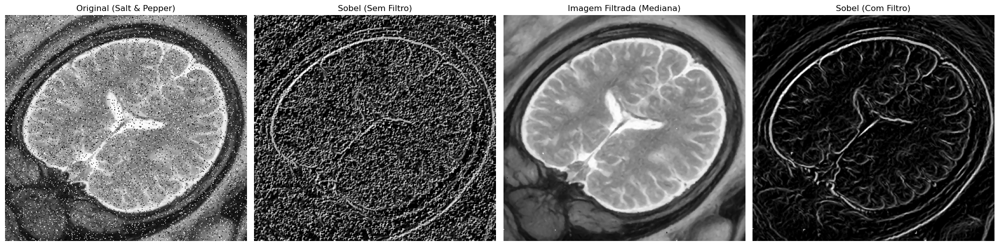

In [52]:
mostrar_imagens(
    imagens=[
        img_salt_pepper,
        gradiente,
        img_salt_filtrada,
        gradiente_f
    ],
    titulos=[
        "Original (Salt & Pepper)",
        "Sobel (Sem Filtro)",
        "Imagem Filtrada (Mediana)",
        "Sobel (Com Filtro)"
    ]
)

#### Observações

- A aplicação direta do operador de Sobel sobre a imagem com ruído salt & pepper gera contornos ruidosos e falsas bordas.
- Isto ocorre devido às variações abruptas de intensidade introduzidas pelo ruído impulsivo.

- Para melhorar o mapa de contornos, é necessário aplicar um pré-processamento de redução de ruído.
- Neste caso, a utilização do filtro de mediana permite eliminar eficazmente esse tipo de ruído.

- Após a filtragem, os contornos tornam-se mais limpos, contínuos e representativos da estrutura do cérebro.

> Assim, a aplicação de filtragem prévia melhora significativamente a qualidade da deteção de contornos.